In [1]:
# colab specifics
# from google.colab import drive
# drive.mount('/content/drive')

import altair as alt
import pandas as pd
import os

print(os.getcwd())

#train_path = 'data/train.csv'
train_path = './../../data/amia-public-challenge-2024/train.csv'
img_size_path = './../../data/amia-public-challenge-2024/img_size.csv'

train_df = pd.read_csv(train_path)
train_df['class_id'] = train_df['class_id'].astype(int)
img_size_df = pd.read_csv(img_size_path)

# Merging the dataframes on 'image_id'
merged_df = pd.merge(train_df, img_size_df, on='image_id', how='inner')

# Function to format the data as specified
def format_data(df):
    formatted_data = {}
    for _, row in df.iterrows():
        image_id = row['image_id']
        og_height = row['dim0']
        og_width = row['dim1']
        class_id = row['class_id']
        rad_id = row['rad_id']

        if pd.isna(row['x_min']):
            bounding_box = [0/og_width, 0/og_height, 1/og_width, 1/og_height]
        else:
            bounding_box = [row['x_min']/og_width, row['y_min']/og_height, row['x_max']/og_width, row['y_max']/og_height]

        if image_id not in formatted_data:
            formatted_data[image_id] = {'classes': {}}

        if class_id not in formatted_data[image_id]['classes']:
            formatted_data[image_id]['classes'][class_id] = {}

        if rad_id not in formatted_data[image_id]['classes'][class_id]:
            formatted_data[image_id]['classes'][class_id][rad_id] = []

        formatted_data[image_id]['og_dims'] = [og_height, og_width]
        formatted_data[image_id]['classes'][class_id][rad_id].append(bounding_box)

    return formatted_data

# Formatting the merged dataframe
image_dict = format_data(merged_df)

import json
# Convert the defaultdict to a regular dict for JSON serialization
image_dict = {k: dict(v) for k, v in image_dict.items()}

# Save the dictionary to a JSON file
json_file_path = 'image_dict.json'
with open(json_file_path, 'w') as json_file:
    json.dump(image_dict, json_file, indent=4)

# # Optionally, download the file to your local machine
# from google.colab import files
# files.download(json_file_path)

s:\studium\CV\src\pre-pro


In [2]:
alt.data_transformers.disable_max_rows()

# Create a histogram of the class_id variable
alt.Chart(train_df).mark_bar().encode(
    x=alt.X('class_id:O', axis=alt.Axis(title='Class ID'), sort='-y'),
    y=alt.Y('count():Q', axis=alt.Axis(title='Frequency')),
    tooltip=[alt.Tooltip('class_name:N', title='Class Name'), alt.Tooltip('count():Q', title='Count')]
).properties(
    title='Histogram of Class ID in the Training Data',
    width=600,
    height=300
)

c:\Anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [3]:
# add a hover selection
#selection = alt.selection_point(fields=['rad_id'])
selection = alt.selection_single(fields=['rad_id']) # for older version on colab

# histogram of number of annotations per radiologist
rads = alt.Chart(train_df).mark_bar().add_selection(selection).encode( # instead of add_params
    x=alt.X('rad_id:O', axis=alt.Axis(title='Radiologist ID'), sort='-y'),
    y=alt.Y('count():Q', axis=alt.Axis(title='Frequency')),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.5)),
    tooltip=[alt.Tooltip('rad_id:N', title='Radiologist ID'), alt.Tooltip('count():Q', title='Count')]
).properties(
    title='Histogram of Radiologist ID in the Training Data',
    width=900,
    height=200
)

# histogram of number of annotations of selected radiologist
annos = alt.Chart(train_df).mark_bar().add_selection(selection).encode( # instead of add_params
    x=alt.X('class_id:O', axis=alt.Axis(title='Class ID')),
    color=alt.Color('class_name:N', legend=None),
    y=alt.Y('count():Q', axis=alt.Axis(title='Frequency')),
    tooltip=[alt.Tooltip('class_name:N', title='Class Name'), alt.Tooltip('count():Q', title='Count'), alt.Tooltip('class_id:O', title='Class ID')]
).transform_filter(selection).properties(
    title='Histogram of Class ID in the Annotations of Selected Radiologist',
    width=900,
    height=200
)


alt.vconcat(rads, annos)

c:\Anaconda3\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'selection_single' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
c:\Anaconda3\Lib\site-packages\altair\utils\deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
c:\Anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Anaconda3\Lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_arra

alt.VConcatChart(...)

This shows us, that multiple radiologists only annotated class 14.

(public shaming: ```R1, R2, R3, R4, R5, R6, and R7```)

('R9', [[0.56201171875, 0.3468, 0.6708984375, 0.434]])
('R10', [[0.93408203125, 0.908, 0.9814453125, 0.9588], [0.265625, 0.1672, 0.44189453125, 0.23], [0.08935546875, 0.8548, 0.17529296875, 0.946], [0.626953125, 0.1716, 0.75634765625, 0.1924]])
('R9', [[0.61669921875, 0.18, 0.734375, 0.1932], [0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416], [0.3291015625, 0.1732, 0.44921875, 0.212]])
('R8', [[0.0830078125, 0.8612, 0.1650390625, 0.968], [0.93115234375, 0.914, 0.98828125, 0.9636]])
('R10', [[0.08935546875, 0.8548, 0.17529296875, 0.946], [0.93408203125, 0.908, 0.9814453125, 0.9588]])
('R9', [[0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416]])
('R9', [[0.19091796875, 0.1924, 0.4765625, 0.4064]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R8', [[0.19775390625, 0.2052, 0.45654296875, 0.3916]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R9', [[0.19091796875, 0.1924, 0.4765

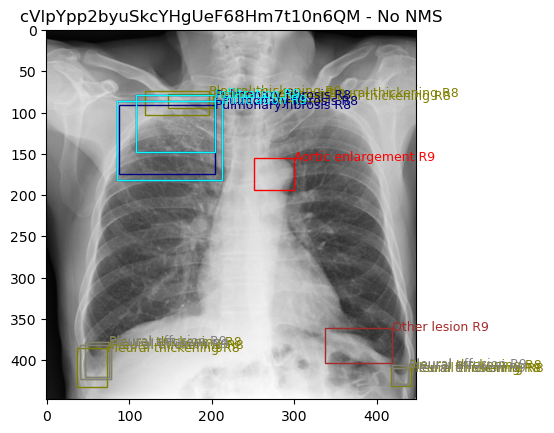

('R9', [[0.56201171875, 0.3468, 0.6708984375, 0.434]])
('R10', [[0.93408203125, 0.908, 0.9814453125, 0.9588], [0.265625, 0.1672, 0.44189453125, 0.23], [0.08935546875, 0.8548, 0.17529296875, 0.946], [0.626953125, 0.1716, 0.75634765625, 0.1924]])
('R9', [[0.61669921875, 0.18, 0.734375, 0.1932], [0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416], [0.3291015625, 0.1732, 0.44921875, 0.212]])
('R8', [[0.0830078125, 0.8612, 0.1650390625, 0.968], [0.93115234375, 0.914, 0.98828125, 0.9636]])
('R10', [[0.08935546875, 0.8548, 0.17529296875, 0.946], [0.93408203125, 0.908, 0.9814453125, 0.9588]])
('R9', [[0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416]])
('R9', [[0.19091796875, 0.1924, 0.4765625, 0.4064]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R8', [[0.19775390625, 0.2052, 0.45654296875, 0.3916]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R9', [[0.19091796875, 0.1924, 0.4765

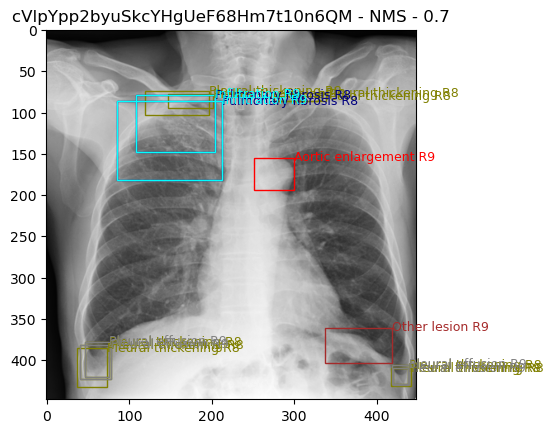

('R9', [[0.56201171875, 0.3468, 0.6708984375, 0.434]])
('R10', [[0.93408203125, 0.908, 0.9814453125, 0.9588], [0.265625, 0.1672, 0.44189453125, 0.23], [0.08935546875, 0.8548, 0.17529296875, 0.946], [0.626953125, 0.1716, 0.75634765625, 0.1924]])
('R9', [[0.61669921875, 0.18, 0.734375, 0.1932], [0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416], [0.3291015625, 0.1732, 0.44921875, 0.212]])
('R8', [[0.0830078125, 0.8612, 0.1650390625, 0.968], [0.93115234375, 0.914, 0.98828125, 0.9636]])
('R10', [[0.08935546875, 0.8548, 0.17529296875, 0.946], [0.93408203125, 0.908, 0.9814453125, 0.9588]])
('R9', [[0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416]])
('R9', [[0.19091796875, 0.1924, 0.4765625, 0.4064]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R8', [[0.19775390625, 0.2052, 0.45654296875, 0.3916]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R9', [[0.19091796875, 0.1924, 0.4765

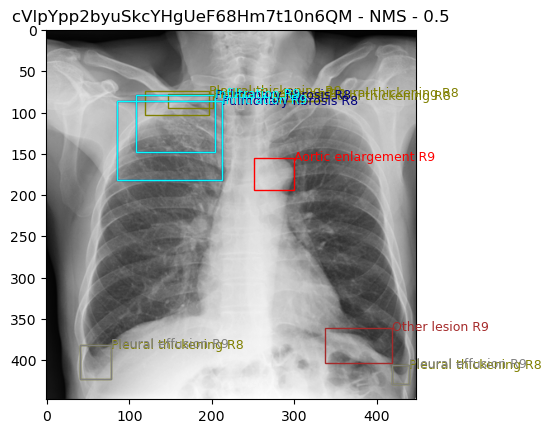

('R9', [[0.56201171875, 0.3468, 0.6708984375, 0.434]])
('R10', [[0.93408203125, 0.908, 0.9814453125, 0.9588], [0.265625, 0.1672, 0.44189453125, 0.23], [0.08935546875, 0.8548, 0.17529296875, 0.946], [0.626953125, 0.1716, 0.75634765625, 0.1924]])
('R9', [[0.61669921875, 0.18, 0.734375, 0.1932], [0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416], [0.3291015625, 0.1732, 0.44921875, 0.212]])
('R8', [[0.0830078125, 0.8612, 0.1650390625, 0.968], [0.93115234375, 0.914, 0.98828125, 0.9636]])
('R10', [[0.08935546875, 0.8548, 0.17529296875, 0.946], [0.93408203125, 0.908, 0.9814453125, 0.9588]])
('R9', [[0.93798828125, 0.9152, 0.97900390625, 0.9616], [0.103515625, 0.8456, 0.16845703125, 0.9416]])
('R9', [[0.19091796875, 0.1924, 0.4765625, 0.4064]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R8', [[0.19775390625, 0.2052, 0.45654296875, 0.3916]])
('R10', [[0.24169921875, 0.1764, 0.45751953125, 0.3324]])
('R9', [[0.19091796875, 0.1924, 0.4765

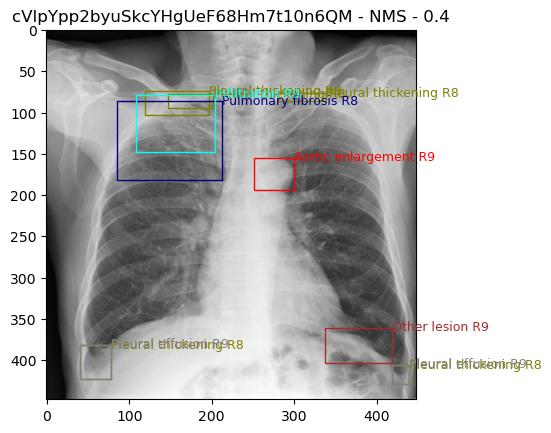

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import json
import torchvision
import torch
from pathlib import Path


class_names = {
    0: "Aortic enlargement",
    1: "Atelectasis",
    2: "Calcification",
    3: "Cardiomegaly",
    4: "Consolidation",
    5: "ILD",
    6: "Infiltration",
    7: "Lung Opacity",
    8: "Nodule/Mass",
    9: "Other lesion",
    10: "Pleural effusion",
    11: "Pleural thickening",
    12: "Pneumothorax",
    13: "Pulmonary fibrosis",
    14: "No finding",
}

root = "./../../data/amia-public-challenge-2024/train/train/"


# plot an image from a dictionary
def img_boxes_show(
    file_name,
    item,
    nms_filter=False,
    iou_threshold=0.4,
    root_path="./../../data/amia-public-challenge-2024/train/train/",
):
    """
    item: dict with keys "classes", "og_dims". Classes containing "classes": {
            "14.0": {
                "R5": [
                    [
                        0.0,
                        0.0,
                        0.0005015045135406219,
                        0.00041152263374485596
                    ]
    """

    # load image from file with PIL
    img = Image.open(root_path + file_name + ".png")

    # resize image
    size = 448
    img = img.resize((size, size))

    # plot image and boxes
    colors = [
        "red",
        "blue",
        "green",
        "orange",
        "purple",
        "yellow",
        "cyan",
        "magenta",
        "pink",
        "brown",
        "gray",
        "olive",
        "teal",
        "navy",
        "lime",
    ]

    # filter out the boxes using non maximum suppression (NMS)
    # only use boxes from the same class_id. Each radiologist can have multiple boxes for the same class
    for class_id in item["classes"]:
        boxes = []
        for rad in item["classes"][class_id].items():
            print(rad)
            for box in rad[1]:
                boxes.append([int(x * size) for x in box])

        if nms_filter:
            boxes_to_keep = torchvision.ops.nms(
                torch.tensor(boxes).float(),  # Convert the tensor to float data type
                torch.tensor([1.0] * len(boxes)),
                iou_threshold=iou_threshold,
            )
        else:
            boxes_to_keep = range(len(boxes))

        plt.imshow(np.array(img), cmap="gray")
        for idx in boxes_to_keep:
            box = boxes[idx]
            x, y, w, h = box
            w = w - x
            h = h - y
            rect = plt.Rectangle(
                (x, y),
                w,
                h,
                fill=False,
                edgecolor=colors[int(float(class_id))],
                linewidth=1,
            )
            plt.gca().add_patch(rect)
            plt.text(
                x + w,
                y - (int(rad[0][1])),
                class_names[int(float(class_id))] + " " + rad[0],
                fontsize=9,
                color=colors[int(float(class_id))],
                verticalalignment="top",
            )

    title = file_name + " - " + ("NMS" if nms_filter else "No NMS") + ((" - " + str(iou_threshold)) if nms_filter else '')
    plt.title(title)
    plt.show()


with open("image_dict.json", "r") as json_file:
    image_dict = json.load(json_file)

# show the first image
file_name = list(image_dict.keys())[145]
# file_name = list(image_dict.keys())[69]
# file_name = list(image_dict.keys())[147]
img_boxes_show(file_name, image_dict[file_name])
img_boxes_show(file_name, image_dict[file_name], nms_filter=True, iou_threshold=0.7)
img_boxes_show(file_name, image_dict[file_name], nms_filter=True, iou_threshold=0.5)
img_boxes_show(file_name, image_dict[file_name], nms_filter=True, iou_threshold=0.4)

In [10]:
# function to combine overlapping boxes from different radiologists and the same class using IoU by pytorch

# wir haben pro image -> class -> radiologist -> [boxes]
# wir wollen boxen derselben klasse von radiologen zusammenfassen, die sich überlappen
# 1: welche boxen kommen in frage
    # alle boxen einer klasse
# 2: welche boxen überlappen sich IoU > threshold

# IoU
# non maximum suppression -> for later in training?
# PyTorch functions: https://pytorch.org/vision/0.9/ops.html
# https://stackoverflow.com/questions/71316130/how-can-i-apply-nms-non-maximum-suppression-on-multiple-images-from-a-dataload/71321448#71321448

# function for every image
    # compare each pair of radiologists (ranking by e.g. number of boxes?)
    # use https://pytorch.org/vision/main/generated/torchvision.ops.box_iou.html to compare 2 sets of boxes
        # search N*M matrix for high IoU -> merge boxes (edge cases when multiple boxes)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json


# Load the CSV file
dict_path = "/kaggle/input/image-dict/image_dict.json"

with open(dict_path) as f:
    data = json.load(f)

box_widths = []
box_heights = []

# Iterate over each image in the dictionary
for image_id, image_data in data.items():
    original_width, original_height = image_data["og_dims"]

    # Iterate over each class
    for class_id, radiologists in image_data["classes"].items():
        if class_id == 14:  # ignore no findings
            continue
        # Iterate over each radiologist's annotations
        for rad_id, boxes in radiologists.items():
            for box in boxes:
                x_min, y_min, x_max, y_max = box

                # Convert relative coordinates to absolute pixel values
                box_width = (x_max - x_min) * 448  # targeted image size for training
                box_height = (y_max - y_min) * 448

                # Append the width and height to the respective lists
                box_widths.append(box_width)
                box_heights.append(box_height)

box_widths = np.array(box_widths)
box_heights = np.array(box_heights)

# Print basic statistics
print("Bounding box width statistics:")
print(
    f"Mean: {box_widths.mean():.2f}, Std: {box_widths.std():.2f}, Min: {box_widths.min():.2f}, Max: {box_widths.max():.2f}"
)

print("\nBounding box height statistics:")
print(
    f"Mean: {box_heights.mean():.2f}, Std: {box_heights.std():.2f}, Min: {box_heights.min():.2f}, Max: {box_heights.max():.2f}"
)

# Plot the distribution of box sizes
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(box_widths, bins=30, kde=True)
plt.title("Distribution of Bounding Box Widths")
plt.xlabel("Width (pixels)")

plt.subplot(1, 2, 2)
sns.histplot(box_heights, bins=30, kde=True)
plt.title("Distribution of Bounding Box Heights")
plt.xlabel("Height (pixels)")

plt.tight_layout()
plt.show()

# Calculate anchor box suggestions using k-means clustering
from sklearn.cluster import KMeans

box_dimensions = np.column_stack((box_widths, box_heights))
num_anchors = 4  # Number of anchors to suggest
kmeans = KMeans(n_clusters=num_anchors, random_state=0).fit(box_dimensions)

# Output the cluster centers as suggested anchor sizes
print("\nSuggested anchor sizes (width x height):")
for anchor_size in kmeans.cluster_centers_:
    print(f"{int(anchor_size[0])} x {int(anchor_size[1])}")
print("\nAspect ratios:")
print([width / height for width, height in kmeans.cluster_centers_])